### Load Modules

In [1]:
# Operation
import pandas as pd
import numpy as np
from sklearn.feature_selection import VarianceThreshold
from sklearn.feature_selection import chi2


# PLotting
%matplotlib inline
import matplotlib.pyplot as plt
import seaborn as sns

## Connection to SQL
import pyodbc

# Preprocessing
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import RobustScaler
from sklearn.preprocessing import LabelEncoder
from sklearn.model_selection import StratifiedKFold
from statsmodels.stats.outliers_influence import variance_inflation_factor
from sklearn.preprocessing import Imputer

# Models
import pickle
from sklearn.decomposition import PCA
from sklearn.linear_model import LogisticRegression
from sklearn.svm import SVC
from sklearn.model_selection import GridSearchCV


### Outlier Treatment

In [21]:
def outlier_detection_(X):
    Summary = X.describe(include='all', percentiles=[.01,.25,.50,.75,.90,.95,.99])

    Unique_Values = {}
    for i in np.arange(len(X.columns)):
        m = X.columns[i]
        n = len(X.iloc[:,i].value_counts())
        dict2 = { m : n }
        Unique_Values.update(dict2)

    Unique = pd.Series(Unique_Values)

    Nan_Values = {}
    for i in np.arange(len(X.columns)):
        m = X.columns[i]
        n = X.iloc[:,i].isnull().sum()
        dict2 = { m : n }
        Nan_Values.update(dict2)

    Nan1 = pd.Series(Nan_Values)

    data_Type = {}
    for i in np.arange(len(X.columns)):
        m = X.columns[i]
        n = X.iloc[:,i].dtype
        dict2 = { m : n }
        data_Type.update(dict2)

    data_Type_final = pd.Series(data_Type)

    Skewness = {}
    for i in np.arange(len(X.columns)):
        m = X.columns[i]
        n = X.iloc[:,i].skew()
        dict2 = { m : n }
        Skewness.update(dict2)

    Skewness_final = pd.Series(Skewness)


    Summary_1 = pd.DataFrame({'Unique Count': Unique, 
                            'Nan Values' : Nan1,
                            "Data Type" : data_Type_final,
                             'Skewness': Skewness_final} 
                          )

    ## inner join them
    Summary_2 = pd.concat([Summary.T,Summary_1],axis=1, join='inner')


    ## Replace Denominotor with zero
    Summary_2.loc[Summary_2['count'] == 0, 'count'] = np.nan

    ## Avoid division by zero
    # Summary_2["[95% : 99%] (Sigma)"] = Summary_2["95%"].div(Summary_2['99%'])
    # Summary_2.loc[~np.isfinite(Summary_2["[95% : 99%] (Sigma)"]), "[95% : 99%] (Sigma)"] = np.nan

    Summary_2['Pct % Missing Values'] = Summary_2['Nan Values'].div(Summary_2['count'].max())*100
    Summary_2.loc[~np.isfinite(Summary_2["Pct % Missing Values"]), "Pct % Missing Values"] = 100


    X2 = Summary_2
    return X2

### Import from SQL

In [ ]:
"""
conn = pyodbc.connect('DRIVER={NetezzaSQL};SERVER=10.10.62.8;PORT=5480;DATABASE=CELEBI_SANDBOX_DB;UID=celebi_usr_11481;PWD=Celcom@11481')

curs = conn.cursor()
sql = "SELECT * FROM CLW_201809_MI_CROSSSELL_UP_LIFT_MAY17_WEEKLY"
gf2 = pd.read_sql_query(sql, conn, chunksize = 50000)
dfs = []
for chunk in gf2:
    dfs.append(chunk)
"""

### Read Data with randomize Sampling

In [3]:
import pandas as pd
import random

# The data to load
f = "Data\MI_Cross_Sell_Monthly_control.csv"

# Count the lines
num_lines = sum(1 for l in open(f))

# Sample size - in this case ~10%
pct = 100
size = int(num_lines / 100 * pct)

# The row indices to skip - make sure 0 is not included to keep the header!
skip_idx = random.sample(range(1, num_lines), num_lines - size)

# Read the data
data = pd.read_csv(f, skiprows=skip_idx, sep="|", index_col='SUBSCRIBER_ARRANGEMENT_ID' )

In [4]:
## Save DataFrame
data.to_pickle('saved_data_monthly_control')

In [7]:
## Read DataFrame
data = pd.read_pickle('saved_data_monthly_control')

In [8]:
data.columns.tolist()

['DATA_DAY',
 'MONTH_TAG',
 'RANK',
 'CONTRACT_PLAN',
 'DEVICE_BRAND',
 'PREVIOUS_DEVICE_BRAND',
 'DEVICE_TYPE',
 'PREVIOUS_DEVICE_TYPE',
 'DEVICE_OS_TYPE',
 'NATIONALITY',
 'PREFERRED_LANGUAGE',
 'ACQUISITION_CHANNEL',
 'CREDIT_BALANCE',
 'NETWORK_BANDS',
 'LAST_DEVICE_CHANGE_DATE',
 'GENDER',
 'AGE',
 'RACE',
 'ACTIVATION_REGION',
 'DEALER_REGION',
 'LAST_DAY',
 'LAST_DEVICE_CHANGE_DAYS',
 'LOS',
 'AMT_REVENUE_MONTH_0',
 'NON_RECURRING_REVENUE_MONTH_0',
 'RECURRING_REVENUE_MONTH_0',
 'USAGE_REVENUE_MONTH_0',
 'NUM_RELOAD_MONTH_0',
 'AMT_ATS_RCV_MONTH_0',
 'AMT_ATS_SEND_MONTH_0',
 'AMT_LAST_RELOAD_MONTH_0',
 'AMT_OUT_CALL_MONTH_0',
 'AMT_OUT_CALL_ADJ_MONTH_0',
 'AMT_OUT_CALL_DIGI_MONTH_0',
 'AMT_OUT_CALL_DOMESTIC_MONTH_0',
 'AMT_OUT_CALL_FIXED_MONTH_0',
 'AMT_OUT_CALL_IDD_MONTH_0',
 'AMT_OUT_CALL_MAXIS_MONTH_0',
 'AMT_OUT_CALL_NADJ_MONTH_0',
 'AMT_OUT_CALL_OFFNET_MONTH_0',
 'AMT_OUT_CALL_ONNET_MONTH_0',
 'AMT_OUT_CALL_SPECIAL_MONTH_0',
 'AMT_OUT_CALL_UMOBILE_MONTH_0',
 'AMT_OUT_CALL_V

In [9]:
# Drop Non-related Columns (future Variables)
data.drop([ 'DATA_DAY', 
            'MONTH_TAG',
            'RANK',
            'LAST_DAY',
            'LAST_DEVICE_CHANGE_DATE',
            'MI_REVENUE_MTH_1',
            'MI_REVENUE_MTH_2',
            'MI_REV_VOL_PURCHASE_MTH_1',
            'MI_REV_MONTHLY_MTH_1',
            'MI_REV_WEEKLY_MTH_1',
            'MI_REV_DAILY_MTH_1',
            'MI_REV_VOL_PURCHASE_MTH_2',
            'MI_REV_MONTHLY_MTH_2',
            'MI_REV_WEEKLY_MTH_2',
            'MI_REV_DAILY_MTH_2',
            'MI_DAILY_TAG',
            'MI_WEEKLY_TAG',
            'MI_MONTHLY_TAG',
            'MI_VOL_PURCHASE_TAG',
            'MI_REVENUE_TAG',
            'MI_REVENUE_RM10_ABOVE',], axis=1 , inplace=True)


In [10]:
y_select = data.iloc[:,-6:]

In [11]:
data = data.iloc[:,:-6]

In [ ]:
# Check for Missing 
print(data.isnull().any())
print()
print(data.info())

In [12]:
print('Shape Data Set   :',data.shape)
print('Shape Target Set :',y_select.shape)

Shape Data Set   : (27853, 709)
Shape Target Set : (27853, 6)


## Data Summary Table

In [ ]:
# pd.pivot_table(df1, index=cols aggfunc=('mean','sum','min','max','median','count'))

In [10]:
## Only Numeric Data
data1 = data._get_numeric_data()

Summary = data.describe(include='all', percentiles=[.25,.50,.75,.90,.95,.99])

Unique_Values = {}
for i in np.arange(len(data.columns)):
    m = data.columns[i]
    n = len(data.iloc[:,i].value_counts())
    dict2 = { m : n }
    Unique_Values.update(dict2)
    
Unique = pd.Series(Unique_Values)

Nan_Values = {}
for i in np.arange(len(data.columns)):
    m = data.columns[i]
    n = data.iloc[:,i].isnull().sum()
    dict2 = { m : n }
    Nan_Values.update(dict2)
    
Nan1 = pd.Series(Nan_Values)

Data_Type = {}
for i in np.arange(len(data.columns)):
    m = data.columns[i]
    n = data.iloc[:,i].dtype
    dict2 = { m : n }
    Data_Type.update(dict2)
    
Data_Type_final = pd.Series(Data_Type)

Skewness = {}
for i in np.arange(len(data1.columns)):
    m = data1.columns[i]
    n = data1.iloc[:,i].skew()
    dict2 = { m : n }
    Skewness.update(dict2)
    
Skewness_final = pd.Series(Skewness)

    
Summary_1 = pd.DataFrame({'Unique Count': Unique, 
                        'Nan Values' : Nan1,
                        "Data Type" : Data_Type_final,
                         'Skewness': Skewness_final} 
                      )

## inner join them
Summary_2 = pd.concat([Summary.T,Summary_1],axis=1, join='inner')

## Replace Denominotor with zero
Summary_2.loc[Summary_2['count'] == 0, 'count'] = np.nan

## Avoid division by zero
# Summary_2["[95% : 99%] (Sigma)"] = Summary_2["95%"].div(Summary_2['99%'])
# Summary_2.loc[~np.isfinite(Summary_2["[95% : 99%] (Sigma)"]), "[95% : 99%] (Sigma)"] = np.nan

Summary_2['Pct % Missing Values'] = Summary_2['Nan Values'].div(Summary_2['count'].max())*100
Summary_2.loc[~np.isfinite(Summary_2["Pct % Missing Values"]), "Pct % Missing Values"] = 100

Summary_2['Single Category %'] = Summary_2['freq'].div(Summary_2['count'])*100

In [11]:
# Export to CSV (Table too big)
Summary_2.to_csv('Summary Statistics/Control/1_Summary_stats.csv')

In [ ]:
# writer = pd.ExcelWriter('1_Summary_stats.xlsx')
# Summary_2.to_excel(writer,'Sheet1')

## Outlier Treatment

### Remove missing values greater than 30%

In [12]:
missing_greater_30_pct = Summary_2[Summary_2['Pct % Missing Values'] > 30].index.tolist()
data.drop(missing_greater_30_pct, axis=1, inplace=True)

In [13]:
data.shape

(27853, 526)

### Visualize with Historgrams

C:\ProgramData\Anaconda3\lib\site-packages\matplotlib\pyplot.py:524: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)
C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\nonparametric\kde.py:494: RuntimeWarning: invalid value encountered in true_divide
  binned = fast_linbin(X,a,b,gridsize)/(delta*nobs)
C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\nonparametric\kdetools.py:34: RuntimeWarning: invalid value encountered in double_scalars
  FAC1 = 2*(np.pi*bw/RANGE)**2


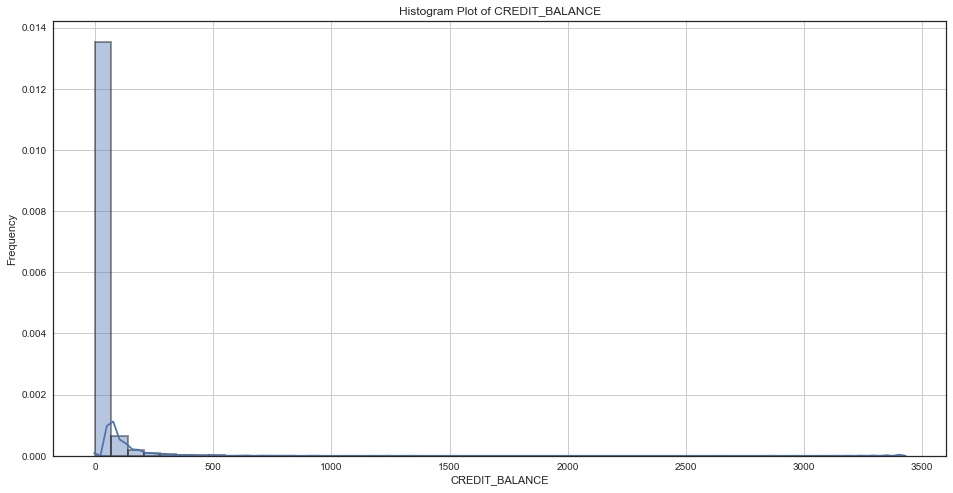

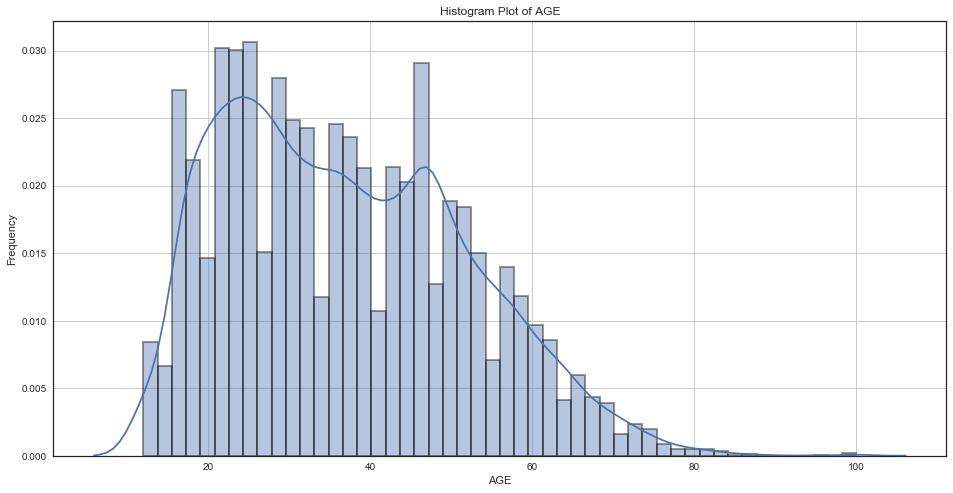

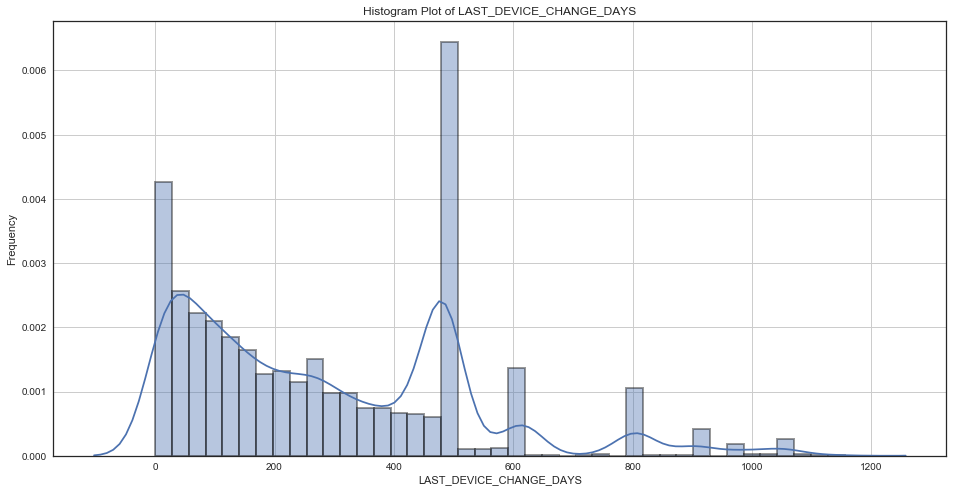

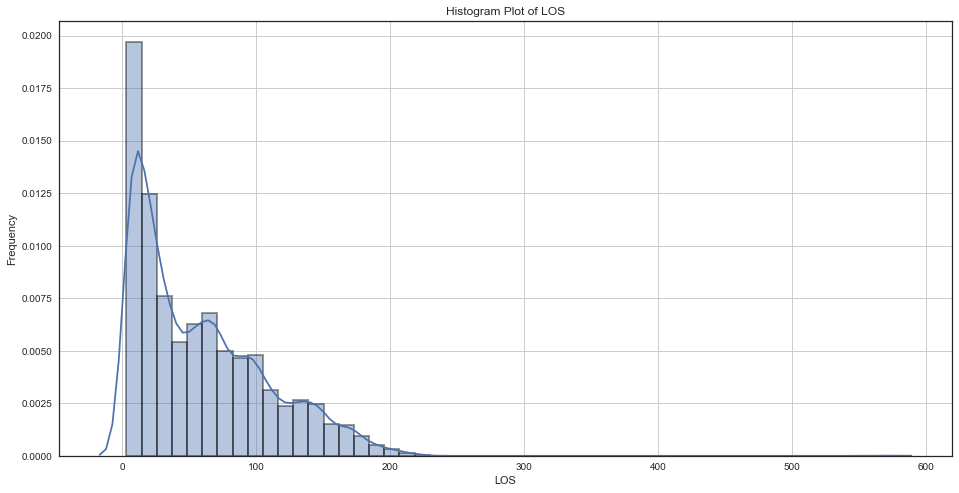

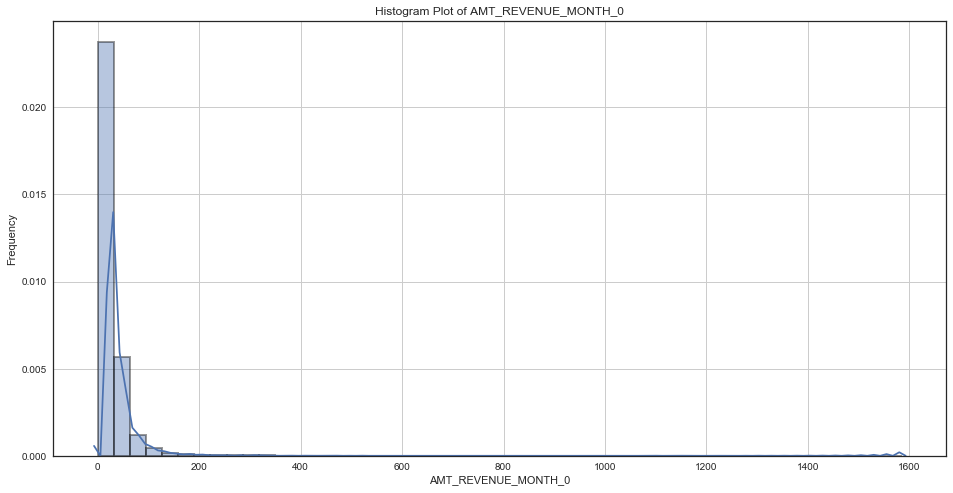

...

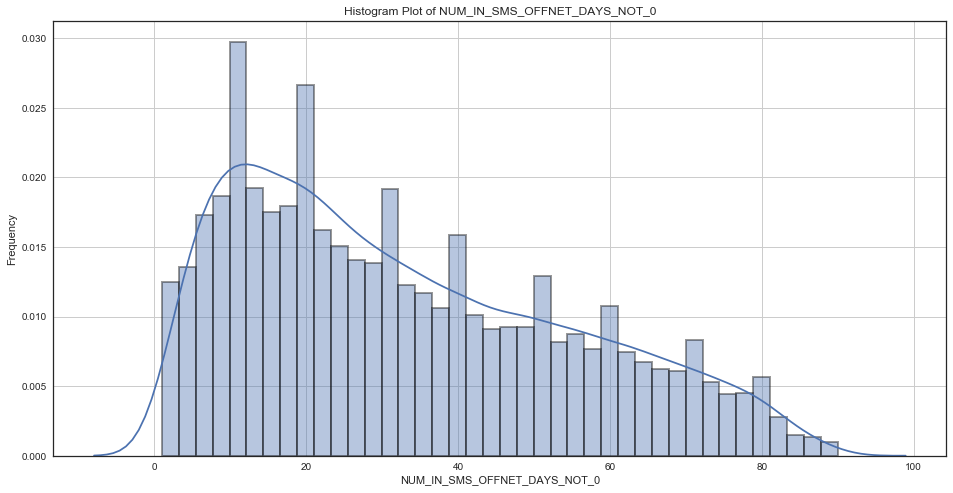

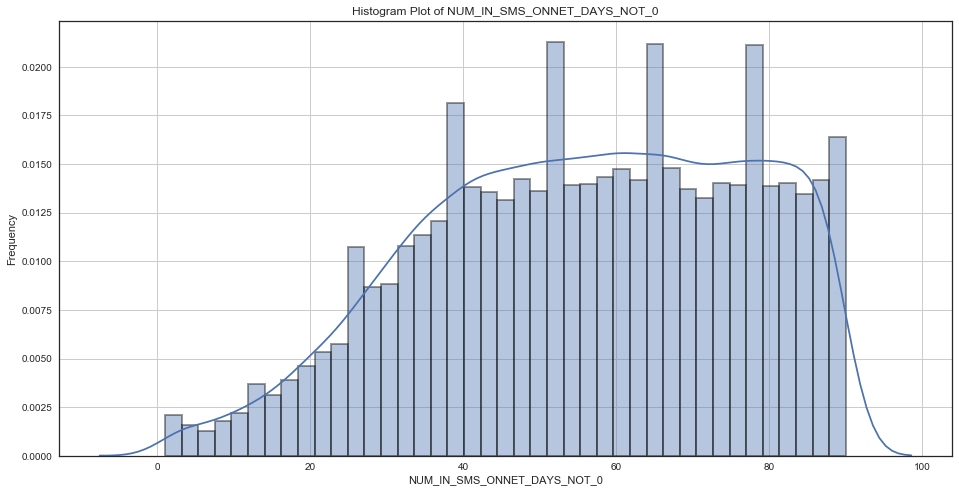

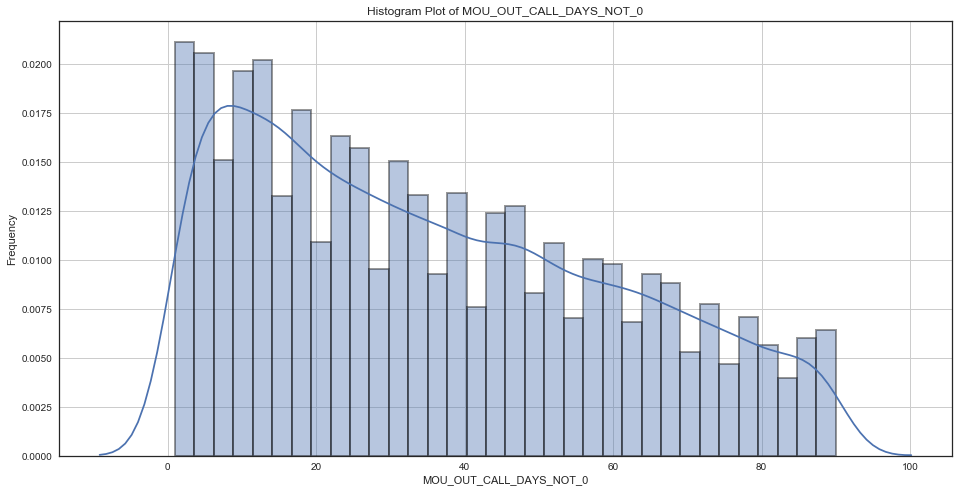

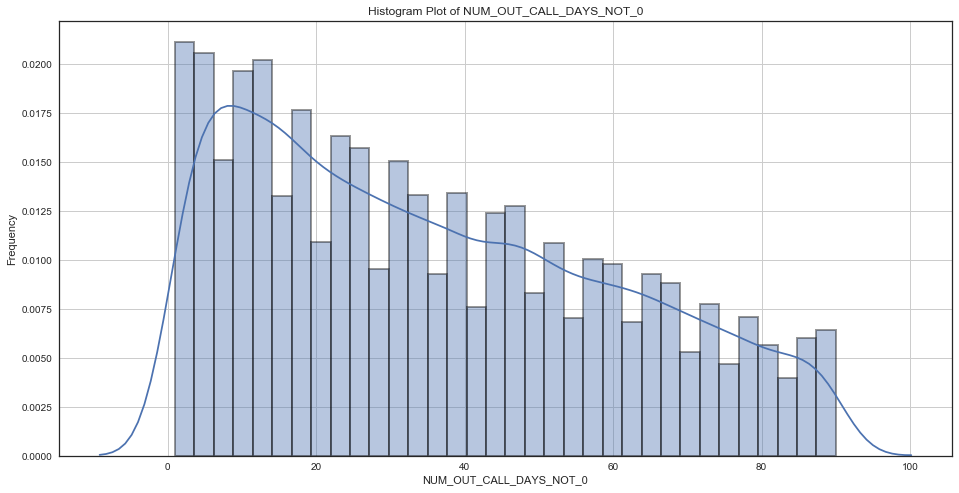

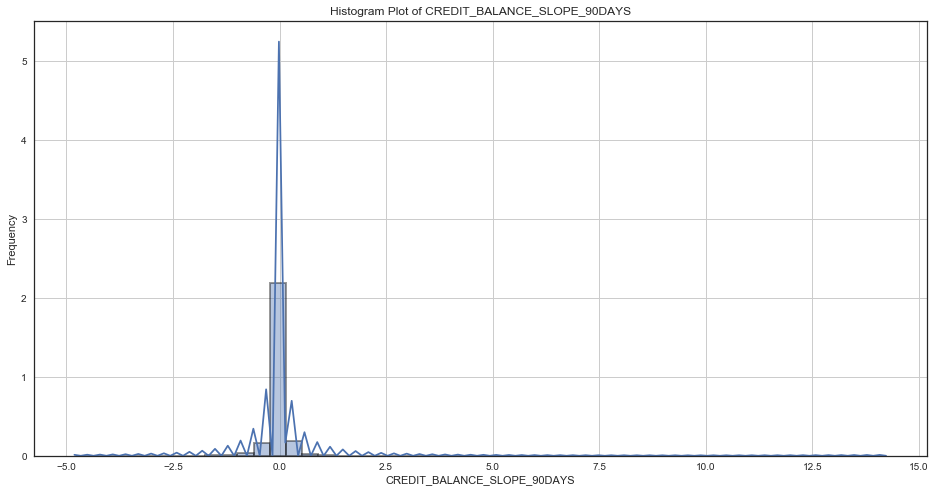

In [14]:
data1 = data._get_numeric_data()

plt.rcParams['font.size'] = 16
plt.style.use('seaborn-white')

for i in range(len(data1.columns)):
    plt.figure(i, figsize=(16,8))
    array_1 = data1[data1.columns[i]][data1[data1.columns[i]].notnull()]
    ax = sns.distplot(array_1, hist_kws=dict(edgecolor="k", linewidth=2))
#     plt.hist(data1[data1.columns[i]], bins=20, edgecolor='black', linewidth=1.2)
    plt.title('Histogram Plot of {0}'.format(data1.columns[i]))
    plt.xlabel(data1.columns[i])
    plt.ylabel('Frequency')
    plt.grid(True)
    plt.figure(i).savefig('Histogram Plot/1_Control/{0}.Histogram Plot of {1}.png'.format(i,data1.columns[i]))

In [15]:
del data1

In [ ]:
## Use Dummies if Unique > 2

In [ ]:
# # Encode All categorial
# le = LabelEncoder()

# df['intplan'] = le.fit_transform(df['intplan'])
# df['voice'] = le.fit_transform(df['voice'])
# df['label'] = le.fit_transform(df['label'])

### Separate into Categorical and Numeric Data

Numerical Data

In [16]:
data_numeric = data._get_numeric_data()

Categorical Data 

In [17]:
cols = list(data_numeric.columns)
cols2 = list(data.columns)

## Find Category Columns
cols_category = [item for item in cols2 if item not in cols]
data_cateogry = data.loc[:,cols_category] 

In [18]:
print("Numeric Data Shape     : ", data_numeric.shape)
print("Categorical Data Shape : ", data_cateogry.shape)

Numeric Data Shape     :  (27853, 503)
Categorical Data Shape :  (27853, 23)


### Impute Missing Variables

In [ ]:
## Impute Missing Variables 
# data_numeric.fillna(0, inplace=True)

In [19]:
# Impute with mean (Columns Only)
# for i in np.arange(len(data_numeric.columns)):
imp = Imputer(missing_values=np.nan, strategy='median', axis=1)
data_numeric = pd.DataFrame(imp.fit_transform(data_numeric), columns=data_numeric.columns.tolist(), index=data_numeric.index)


In [22]:
# Export to CSV (Table too big)
outlier_detection_(data_numeric).to_csv('Summary Statistics/Control/1_Summary_stats_missing_filled.csv')

### Remove 99% Percentile = 0

In [23]:
Ptile_99_zero = (data_numeric.quantile(.99) != 0)
Index_of_Ptile_99_non_zero =  np.where(Ptile_99_zero.tolist())[0].tolist()

data_numeric = data_numeric.iloc[:,Index_of_Ptile_99_non_zero]

In [24]:
print("Numeric Data Treated Shape: ", data_numeric.shape)

Numeric Data Treated Shape:  (27853, 464)


### Remove Low Variance Variables

In [25]:
low_vairance_removal = VarianceThreshold(.1)
low_vairance_removal.fit_transform(data_numeric)
Columns_remaining = list(low_vairance_removal.get_support(indices=True))

data_numeric = data_numeric.iloc[:,Columns_remaining]

In [26]:
print("Numeric Data Treated Shape: ", data_numeric.shape)

Numeric Data Treated Shape:  (27853, 398)


99th Percentile Treatment

In [27]:
## 99th Percentile Treatment

ptile_99 = data_numeric.quantile(0.99)
outliers_99_ptile = (data_numeric > ptile_99)

data_treated_outlier = data_numeric.mask(outliers_99_ptile, ptile_99, axis=1)

1st Percentile Treatment

In [28]:
## 1st Percentile Treatment

ptile_01 = data_treated_outlier.quantile(0.01)
outliers_01_ptile = (data_treated_outlier < ptile_01)

data_treated_outlier = data_treated_outlier.mask(outliers_01_ptile, ptile_01, axis=1)

In [29]:
# Export to CSV (Table too big)
outlier_detection_(data_treated_outlier).to_csv('Summary Statistics/Control/1_Summary_stats_outlier_treated.csv')

In [ ]:
# data_treated_outlier = data_outlier.apply(lambda x : [y if y <= 6 else 6 for y in x])

### Plot distribution

In [ ]:
data1 = data_treated_outlier

plt.rcParams['font.size'] = 16
plt.style.use('seaborn-white')

for i in range(len(data1.columns)):
    plt.figure(i, figsize=(16,8))
    array_1 = data1[data1.columns[i]][data1[data1.columns[i]].notnull()]
    ax = sns.distplot(array_1, hist_kws=dict(edgecolor="k", linewidth=2))
#     plt.hist(data1[data1.columns[i]], bins=20, edgecolor='black', linewidth=1.2)
    plt.title('Histogram Plot of {0}'.format(data1.columns[i]))
    plt.xlabel(data1.columns[i])
    plt.ylabel('Frequency')
    plt.grid(True)
    plt.figure(i).savefig('Histogram Plot/2_Control/{0}.Histogram Plot of {1}.png'.format(i,data1.columns[i]))

### Scale Data

In [ ]:
## List out global Variable
dir()

In [31]:
# Standard Scaler
data_scaled = StandardScaler().fit_transform(data_treated_outlier)

## Rename Columns and Index
data_scaled = pd.DataFrame(data_scaled, columns=list(data_treated_outlier.columns), index=data_treated_outlier.index.tolist())

In [32]:
## Output Standardize Data 
Standard_output = outlier_detection_(data_scaled)

Standard_output.to_csv('Summary Statistics/Control/2_Summary_stats_Standardize_Treated.csv')

### Combine with Categorical data  

In [33]:
## Combine categorival and numerical data 
data_treated = pd.concat([data_scaled, data_cateogry],axis=1 ,join_axes=[data_cateogry.index] )

In [34]:
## Dummy variables
data_treated_dummies = pd.get_dummies(data_treated,drop_first=True)

### Save & Load Point

In [35]:
# Save DataFrame
data_treated_dummies.to_pickle('saved_treated_scaled_dummy_data_controlled')

In [4]:
# Load DataFrame
data_treated_dummies = pd.read_pickle('saved_treated_scaled_dummy_data')

### Multi-Colinearity

Pearson (R) not R^2

In [36]:
Multi_Colinear = data_treated_dummies.corr(method='pearson')
Multi_Colinear.to_csv('Summary Statistics/Control/3_Multi_Colinearity_plot.csv')

In [38]:
def correlation(dataset, threshold):
    col_corr = set() # Set of all the names of deleted columns
    corr_matrix = dataset.corr()
    for i in range(len(corr_matrix.columns)):
        for j in range(i):
            if corr_matrix.iloc[i, j] >= threshold and corr_matrix.iloc[i, j] < 1.00:
                colname = corr_matrix.columns[i] # getting the name of column
                col_corr.add(colname)
                if colname in dataset.columns:
                    del dataset[colname] # deleting the column from the dataset

In [39]:
correlation(data_treated_dummies ,0.8)

In [40]:
data_treated_dummies.shape

(27853, 262)

In [41]:
# Save DataFrame
data_treated_dummies.to_pickle('saved_corr_treated_scaled_dummy_data_controlled')

In [14]:
# Save targets DataFrame
y_select.to_pickle('Targets')

In [43]:
y_select = pd.read_pickle('Targets')

In [44]:
#Prevalence
y_select.TARGET_MI_ALL.value_counts()[1]/len(y_select)*100

3.2097081104369365

In [45]:
y_select.columns.tolist()

['TARGET_DAILY',
 'TARGET_WEEKLY',
 'TARGET_MONTHLY',
 'TARGET_VOL_PURCHASE',
 'TARGET_MI_ALL',
 'TARGET_MI_ALL_RM10_ABOVE']

Variance Inflation Factor (VIF)

In [ ]:
## VIF Funciton
def calculate_vif_(X):

    '''X - pandas dataframe'''
    thresh = 5.0
    variables = range(X.shape[1])

    for i in np.arange(0, len(variables)):
        vif = [variance_inflation_factor(X.iloc[:,variables].values, ix) for ix in range(X.iloc[:,variables].shape[1])]
        print(vif)
        maxloc = vif.index(max(vif))
        if max(vif) > thresh:
            print('dropping \'' + X.iloc[:,variables].columns[maxloc] + '\' at index: ' + str(maxloc))
            del variables[maxloc]

    print('Remaining variables:')
    print(X.columns[variables])
    return X

In [ ]:
calculate_vif_(data_multi_coliner)

In [ ]:
# # This Python 3 environment comes with many helpful analytics libraries installed
# # It is defined by the kaggle/python docker image: https://github.com/kaggle/docker-python
# # For example, here's several helpful packages to load in 

# import numpy as np # linear algebra
# import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# # Input data files are available in the "../input/" directory.
# # For example, running this (by clicking run or pressing Shift+Enter) will list the files in the input directory

# from subprocess import check_output
# # print(check_output(["ls", "../input"]).decode("utf8"))

# # Any results you write to the current directory are saved as output.

# # Extra imports necessary for the code

# from sklearn.base import BaseEstimator, TransformerMixin
# from sklearn.preprocessing import Imputer

# from statsmodels.stats.outliers_influence import variance_inflation_factor

In [ ]:
# from statsmodels.stats.outliers_influence import variance_inflation_factor

# class ReduceVIF(BaseEstimator, TransformerMixin):
#     def __init__(self, thresh=5.0, impute=True, impute_strategy='median'):
#         # From looking at documentation, values between 5 and 10 are "okay".
#         # Above 10 is too high and so should be removed.
#         self.thresh = thresh
        
#         # The statsmodel function will fail with NaN values, as such we have to impute them.
#         # By default we impute using the median value.
#         # This imputation could be taken out and added as part of an sklearn Pipeline.
#         if impute:
#             self.imputer = Imputer(strategy=impute_strategy)

#     def fit(self, X, y=None):
#         print('ReduceVIF fit')
#         if hasattr(self, 'imputer'):
#             self.imputer.fit(X)
#         return self

#     def transform(self, X, y=None):
#         print('ReduceVIF transform')
#         columns = X.columns.tolist()
#         if hasattr(self, 'imputer'):
#             X = pd.DataFrame(self.imputer.transform(X), columns=columns)
#         return ReduceVIF.calculate_vif(X, self.thresh)

#     @staticmethod
#     def calculate_vif(X, thresh=5.0):
#         # Taken from https://stats.stackexchange.com/a/253620/53565 and modified
#         dropped=True
#         while dropped:
#             variables = X.columns
#             dropped = False
#             vif = [variance_inflation_factor(X[variables].values, X.columns.get_loc(var)) for var in X.columns]
            
#             max_vif = max(vif)
#             if max_vif > thresh:
#                 maxloc = vif.index(max_vif)
#                 print(f'Dropping {X.columns[maxloc]} with vif={max_vif}')
#                 X = X.drop([X.columns.tolist()[maxloc]], axis=1)
#                 dropped=True
#         return X

In [ ]:
# transformer = ReduceVIF()

# # Only use 10 columns for speed in this example
# data2 = transformer.fit_transform(data1.iloc[:,:-1], data1.iloc[:,-1])

# data2.head()

In [ ]:
# corr_matrix = data1.iloc[:,:-1].corr().abs()
# corr_matrix
# #the matrix is symmetric so we need to extract upper triangle matrix without diagonal (k = 1)
# os = (corr_matrix.where(np.triu(np.ones(corr_matrix.shape), k=1).astype(np.bool))
#       .stack().sort_index(level=[0], ascending=False))
# os
# # os.sort_values(axis=0, ascending=False)
# #first element of os series is the pair with the bigest correlation